## *KONVOLUCIJA*

In [37]:
import tkinter as tk
from PIL import Image, ImageGrab, ImageTk
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import convolve2d
from pyscreenshot import grab

In [2]:
# Učitaj sliku
img = Image.open("C:\\Users\\Lenovo\\Desktop\\slika.jpg")

In [3]:
# Pretvaranje slike u numpy array
img_array = np.array(img)
output_array = np.array(img)

In [4]:
# Matrica jezgre za konvoluciju - blur
kernel = np.array([[1, 1, 1],
                   [1, 1, 1],
                   [1, 1, 1]])

In [5]:
# Primjena konvolucije na sliku 

for i in range(output_array.shape[-1]):
    output_array[:,:,i] = convolve2d(output_array[:,:,i], kernel, mode = "same")

In [6]:
# Stvori Tkinter prozor
root = tk.Tk()

In [7]:
# Stvori Tkinter slike iz numpy array-a
img_tk = ImageTk.PhotoImage(Image.fromarray(img_array))
output_tk = ImageTk.PhotoImage(Image.fromarray(output_array))

In [8]:
# Stvaranje okvira i dodavanje slika
frame = tk.Frame(root)
frame.pack(side = "top", padx = 20, pady = 20)

label1 = tk.Label(frame, image = img_tk)
label2 = tk.Label(frame, image = output_tk)

label1.pack(side = "left")
label2.pack(side = "right")

In [9]:
# Pokretanje Tkinter petlje
root.mainloop()

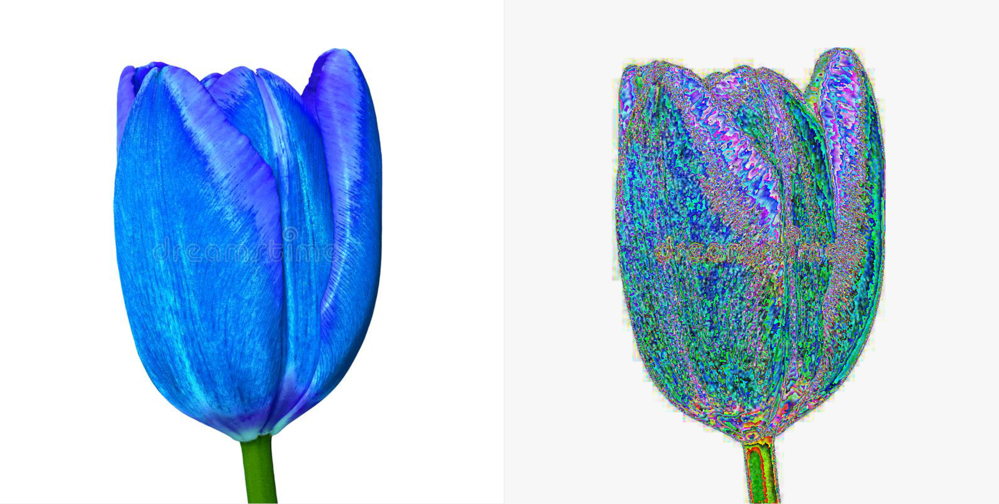

In [21]:
# Čitava funkcija za crtanje
def convolution(mat):   
    img_array = np.array(img)
    output_array = np.array(img)

    for i in range(output_array.shape[-1]):
        output_array[:,:,i] = convolve2d(output_array[:,:,i], mat, mode = "same")
    
    root = tk.Tk()
    img_tk = ImageTk.PhotoImage(Image.fromarray(img_array))
    output_tk = ImageTk.PhotoImage(Image.fromarray(output_array))

    frame = tk.Frame(root)
    frame.pack(side = "top", padx = 20, pady = 20)

    label1 = tk.Label(frame, image = img_tk)
    label2 = tk.Label(frame, image = output_tk)

    label1.pack(side = "left")
    label2.pack(side = "right")

    root.mainloop()

In [22]:
# Druga matrica jezgre za konvoluciju - sharpen
kernel2 = np.array([[0, -1, 0],
                    [-1, 5, -1],
                   [0, -1, 0]])

In [23]:
convolution(kernel2)

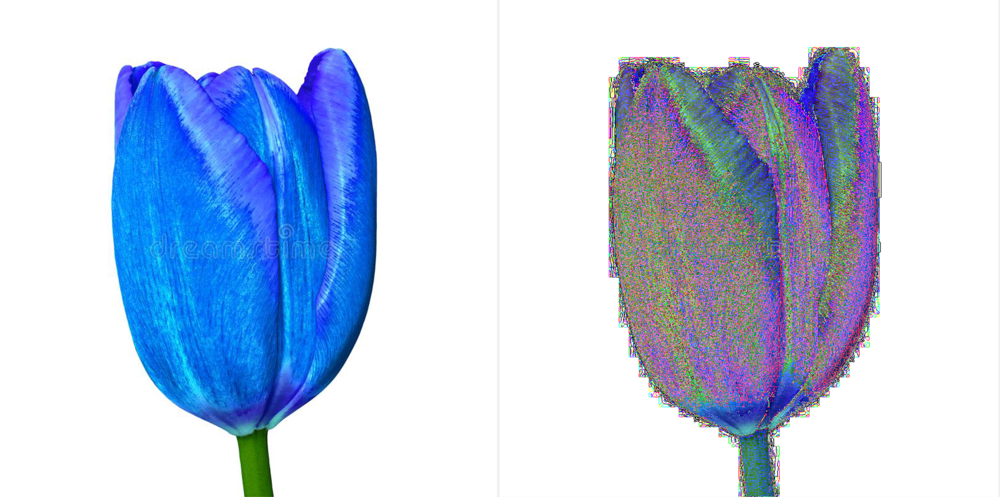

In [41]:
# Treća matrica jezgre za konvoluciju
kernel3 = np.array([[1, 0, 1],
                    [0, 1, 0],
                    [1, 0, 1]])

In [42]:
convolution(kernel3)

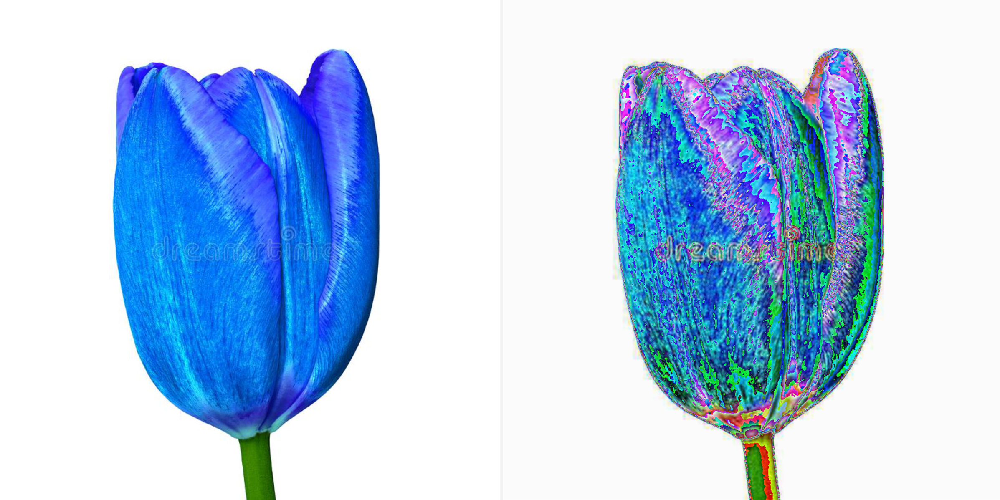

## *MAX_POOLING*

In [44]:
def max_pooling(pool_size = 2):
    out = np.zeros((output_array.shape[0]//pool_size, output_array.shape[1]//pool_size), dtype=np.uint8)
    for i in range(out.shape[0]):
        for j in range(out.shape[1]):
            out[i, j] = np.max(output_array[i*pool_size:(i+1)*pool_size, j*pool_size:(j+1)*pool_size])
    return out

In [49]:
pooled = max_pooling(pool_size = 2)

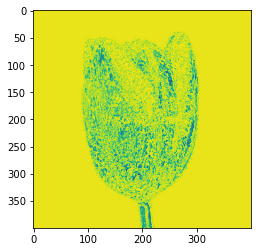

In [50]:
plt.imshow(pooled)